In [10]:
"""
EDA:
  1. Rows and columns in dataset are: (2318, 11) respectively.  
  2. No null values are present in dataset.
  3. From 11 columns, 5 are int64, 6 are object type.
  4. Description of column are as follows: 

    Price: The sale price of the vehicle in the ad
    Mark: The brand of car
    Model: model of the vehicle
    Years: The vehicle registration year
    Mileage: miles traveled by vehicle
    Engine_capacity: The measurement of the total volume of the cylinders in the engine
    Transmission: The type of gearbox used by the car
    Drive: wheel drive(2wd, 4wd and awd)
    Hand_drive: Left-hand traffic (LHT) and right-hand traffic (RHT)
    Fuel: The type of fuel used by the car( gasoline, diesel, hybrid, lpg and cng)  
    
    5. From descriptive statistics of dataset column suggest following pointers:
            All columns have equal counts.
            Minimum and maximum price of car ranges from 80 to 1400. Cars with varity of prices are present.
            Standard deviation is 288 which seems ok. Some outliers could be present in price column due to huge variation.
            Huge standard deviation is present in mileage column that denotes some outliers could be present.
            Data description of engine capacity column seems to be ok.
    
    6. Grouping column on the basis of price to check which category is high priced:
            By mark: audi,bmw,citroen,ford hino,hyundai,and other branded cars are overpriced.
            By model: 1 series, 3 series, zest xtype have high price.
            mt transmission are high in prices.
            On an average awd drive cars have high prices.
            Left hand, diesel and lpg cars have high prices.
    
    7. By data distribution of numerical columns
        'price', 'year', 'mileage', 'engine_capacity' tend to be skewed thus we will have to remove skewness.
        
    8. As we briefed using discription and data distribution, 'price', 'year', 'mileage', 'engine_capacity'
       have outliers which need to be removed for better model performance and accuracy.
       
    9. After removing outliers we are left with 2262 rows and less skewed data.
    
    10. Scatter plots depict the following points:
            Cars having these features: cng lpg diesel fuel type , both lhd and rhd, 
            mainly awd drive type, at transmission type and land rover , ford, citroen, 
            mitsouka, volvo, audi etc have high relation with price column.
            
    11. Lm plot shows positive relation between: id, engine capacity,
        neutral relation with mileage, and negative relation between year and price.
        
    12. Correlation heatmap denotes high correlation between id and price column, so we will furthut cross
        check it using VIF.

        VIF confirms that there is no correlation between id and price.

        Data skewness is also with range thus data is not skewed and ready for analysis.

        Furthur we have used get_dummies function to encode categorical data and using scree plot and principal component analysis 
        we will use top 250 column most correlated with price label. These features are stored in "feat" variable.
    
    13. From different models we have used, RandomForestRegressor predicts the price label with best accuracy of 99.98 percent.
        Best random_state for the model is 199. Hyper parameter tuning is also carried out with cross validation to improve the result.

"""

'\nEDA:\n  1. Rows and columns in dataset are: (2318, 11) respectively.  \n  2. No null values are present in dataset.\n  3. From 11 columns, 5 are int64, 6 are object type.\n  4. Description of column are as follows: \n\n    Price: The sale price of the vehicle in the ad\n    Mark: The brand of car\n    Model: model of the vehicle\n    Years: The vehicle registration year\n    Mileage: miles traveled by vehicle\n    Engine_capacity: The measurement of the total volume of the cylinders in the engine\n    Transmission: The type of gearbox used by the car\n    Drive: wheel drive(2wd, 4wd and awd)\n    Hand_drive: Left-hand traffic (LHT) and right-hand traffic (RHT)\n    Fuel: The type of fuel used by the car( gasoline, diesel, hybrid, lpg and cng)  \n    \n    5. From descriptive statistics of dataset column suggest following pointers:\n            All columns have equal counts.\n            Minimum and maximum price of car ranges from 80 to 1400. Cars with varity of prices are present.\

In [2]:
# Imp libs:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from pandas_profiling import ProfileReport

# Standardizing and Normalizing data:
from sklearn.preprocessing import StandardScaler

from sklearn.linear_model import LinearRegression
import xgboost as xgb

# Spliting data
from sklearn.model_selection import train_test_split,GridSearchCV

# Importing metrics
from sklearn import metrics
from sklearn.metrics import r2_score,mean_squared_error

# Removing warnings
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

In [3]:
training_dataset = 'https://raw.githubusercontent.com/dsrscientist/dataset4/main/Japan_used_cars_datasets.csv'
df = pd.read_csv(training_dataset)

In [3]:
df.head()

,id,price,mark,model,year,mileage,engine_capacity,transmission,drive,hand_drive,fuel
0,0,80,nissan,march,2003,80000,1240,at,2wd,rhd,gasoline
1,1,110,nissan,march,2010,53000,1200,at,2wd,rhd,gasoline
2,2,165,nissan,lafesta,2005,47690,2000,at,2wd,rhd,gasoline
3,3,190,toyota,avensis,2008,130661,1990,at,2wd,rhd,gasoline
4,4,190,daihatsu,mira,2006,66300,660,at,2wd,rhd,gasoline


In [4]:
df.shape

(2318, 11)

In [5]:
df.isnull().sum()

id                 0
price              0
mark               0
model              0
year               0
mileage            0
engine_capacity    0
transmission       0
drive              0
hand_drive         0
fuel               0
dtype: int64

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2318 entries, 0 to 2317
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   id               2318 non-null   int64 
 1   price            2318 non-null   int64 
 2   mark             2318 non-null   object
 3   model            2318 non-null   object
 4   year             2318 non-null   int64 
 5   mileage          2318 non-null   int64 
 6   engine_capacity  2318 non-null   int64 
 7   transmission     2318 non-null   object
 8   drive            2318 non-null   object
 9   hand_drive       2318 non-null   object
 10  fuel             2318 non-null   object
dtypes: int64(5), object(6)
memory usage: 199.3+ KB


In [8]:
"""Descriptive analytics:
    
It can be observed that there are no null values.



All values seem to be ok."""

df.describe()

"""


"""

,id,price,year,mileage,engine_capacity
count,2318.000000,2318.000000,2318.000000,2318.000000,2318.000000
mean,1169.047023,971.522433,2005.972390,100013.194996,1507.010785
std,674.460724,288.673112,3.698863,52512.478883,549.585170
min,0.000000,80.000000,1979.000000,2000.000000,9.000000
25%,583.250000,776.000000,2004.000000,67000.000000,1300.000000
50%,1168.500000,1000.000000,2006.000000,94000.000000,1490.000000
75%,1753.750000,1213.000000,2009.000000,124000.000000,1800.000000
max,2335.000000,1400.000000,2015.000000,790000.000000,12340.000000


In [9]:
# Lets check for duplicated values:

print(df[df.duplicated(keep=False)])


Empty DataFrame
Columns: [id, price, mark, model, year, mileage, engine_capacity, transmission, drive, hand_drive, fuel]
Index: []


In [4]:
# Differentiating continuous and categorical data:

cont_data = df.select_dtypes(include=['int64','float64'])

cat_data= df.select_dtypes(include=['object'])

cont_columns = cont_data.columns

cat_columns = cat_data.columns

print('Numerical columns: ', cont_columns)

print('Categorical columns: ', cat_columns)

Numerical columns:  Index(['id', 'price', 'year', 'mileage', 'engine_capacity'], dtype='object')
Categorical columns:  Index(['mark', 'model', 'transmission', 'drive', 'hand_drive', 'fuel'], dtype='object')


In [11]:
print(len(cont_columns) )
print(len(cat_columns))

5
6


In [12]:
# Understanding column values:

col_names = df.columns

for i in col_names:
    print('For column ',i,' entries are as follows: \n\n',df[i],'\n\n')

For column  id  entries are as follows: 

 0          0
1          1
2          2
3          3
4          4
        ... 
2313    2331
2314    2332
2315    2333
2316    2334
2317    2335
Name: id, Length: 2318, dtype: int64 


For column  price  entries are as follows: 

 0         80
1        110
2        165
3        190
4        190
        ... 
2313    1400
2314    1400
2315    1400
2316    1400
2317    1400
Name: price, Length: 2318, dtype: int64 


For column  mark  entries are as follows: 

 0         nissan
1         nissan
2         nissan
3         toyota
4       daihatsu
          ...   
2313      toyota
2314      toyota
2315      subaru
2316       honda
2317      toyota
Name: mark, Length: 2318, dtype: object 


For column  model  entries are as follows: 

 0          march
1          march
2        lafesta
3        avensis
4           mira
          ...   
2313        vitz
2314      estima
2315          r2
2316           z
2317    estima t
Name: model, Length: 2318, dtype: 

In [7]:
for i in cat_columns:
    print(df.groupby(by=i).price.mean().to_frame())

                     price
mark                      
audi           1027.000000
bmw            1184.666667
chrysler        625.000000
citroen        1104.000000
daihatsu        916.946429
ford           1350.000000
gm              750.000000
hino           1372.000000
honda           948.041885
hyundai        1305.000000
isuzu          1174.000000
jaguar         1385.000000
kia motors     1185.500000
kubota          300.000000
land rover     1100.500000
mazda           956.337838
mercedes-benz   765.200000
mitsubishi      840.630769
mitsuoka       1120.000000
nissan          797.684375
opel            760.000000
peugeot        1057.500000
smart           933.500000
subaru         1048.425926
suzuki          985.595238
toyota         1024.912130
volkswagen     1092.134615
volvo          1262.500000
                     price
model                     
1 series       1307.500000
207             940.000000
3 series       1234.357143
307            1175.000000
a-class         336.000000
.

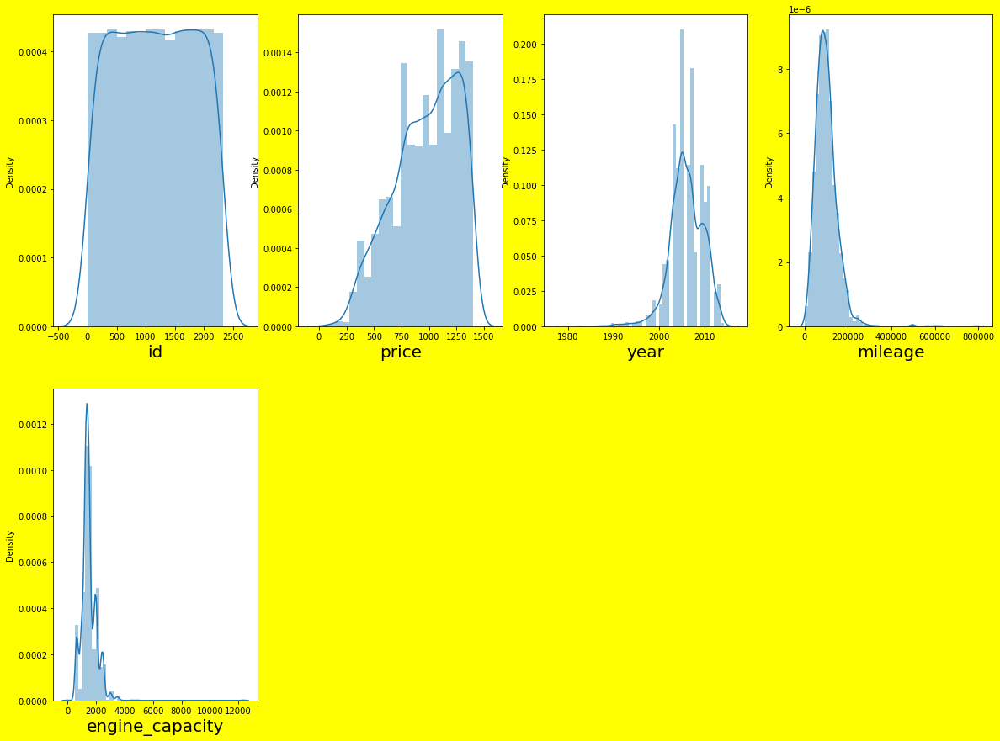

In [13]:
# Checking data distribution of numerical columns: 

plt.figure(figsize=(20,15),facecolor='Yellow')
plotnumber = 1
for column in cont_columns:
    if plotnumber <= 5:
        ax = plt.subplot(2,4,plotnumber)
        sns.distplot(df[column])
        plt.xlabel(column,fontsize=20)
    plotnumber += 1
plt.show()

In [91]:
# Checking value counts in each column: 

for i in col_names:
    print('For column name --',i,'-- different value counts are: \n', df[i].value_counts(),'\n')
    print('For column name --',i,'-- Unique value counts are: ', df[i].nunique(),'\n\n')  

For column name -- id -- different value counts are: 
 1       1
1553    1
1547    1
1548    1
1549    1
       ..
767     1
766     1
765     1
764     1
2335    1
Name: id, Length: 2262, dtype: int64 

For column name -- id -- Unique value counts are:  2262 


For column name -- price -- different value counts are: 
 850     69
790     58
1306    55
1120    55
900     44
        ..
165      1
935      1
953      1
957      1
110      1
Name: price, Length: 346, dtype: int64 

For column name -- price -- Unique value counts are:  346 


For column name -- mark -- different value counts are: 
 toyota           1041
honda             374
nissan            306
mazda             143
suzuki            123
mitsubishi         62
volkswagen         51
daihatsu           51
subaru             49
bmw                27
hyundai             9
mercedes-benz       4
kia motors          4
audi                3
smart               2
isuzu               2
volvo               2
mitsuoka            1
for

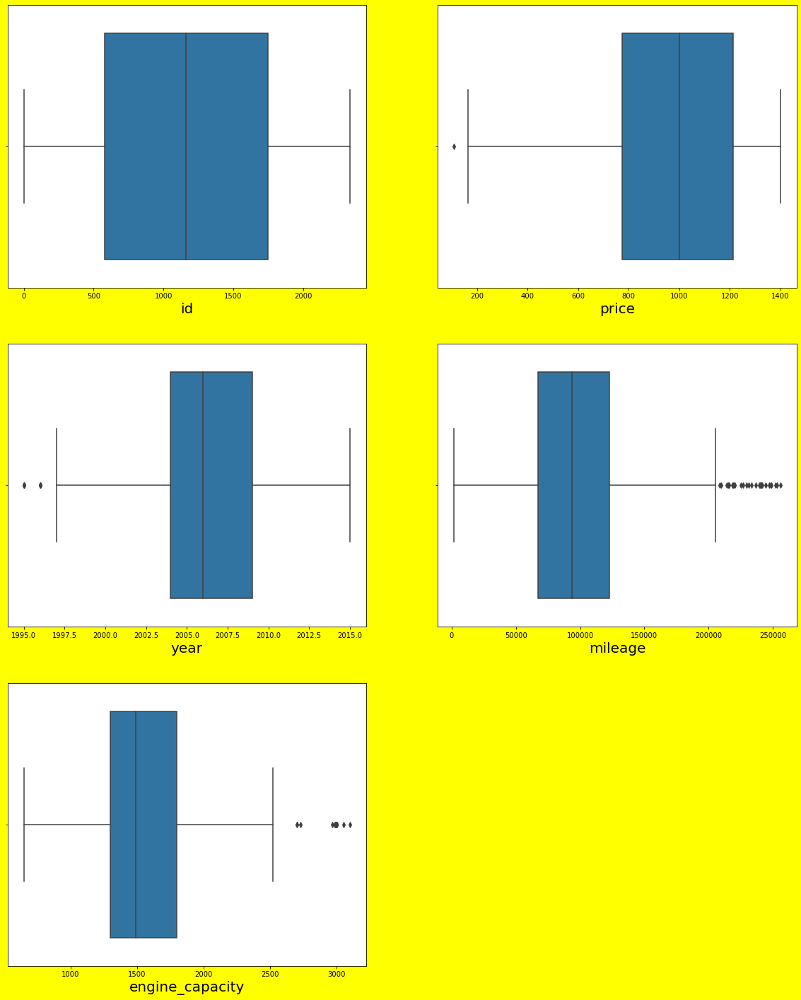

In [92]:
plt.figure(figsize=(20,25),facecolor='Yellow')
plotnumber = 1
for column in cont_columns:
    if plotnumber <= 5:
        ax = plt.subplot(3,2,plotnumber)
        sns.boxplot(df[column])
        plt.xlabel(column,fontsize=20)
    plotnumber += 1
plt.show()

In [14]:
# Using Z Statistics to check and remove any more outliers:

from scipy.stats import zscore

z_score = zscore(df[cont_columns])

abs_z_score = np.abs(z_score)

filtering_entry = (abs_z_score < 3).all(axis=1) # values lying in 3 times std will be removed

df = df[filtering_entry]

df.describe()

,id,price,year,mileage,engine_capacity
count,2262.000000,2262.000000,2262.000000,2262.000000,2262.000000
mean,1164.478338,969.938992,2006.137047,97778.549072,1491.956233
std,673.726566,287.956003,3.357875,43247.336503,464.416194
min,1.000000,110.000000,1995.000000,2000.000000,650.000000
25%,579.250000,775.000000,2004.000000,67000.000000,1300.000000
50%,1162.500000,1000.000000,2006.000000,93613.000000,1490.000000
75%,1750.750000,1213.000000,2009.000000,122894.250000,1800.000000
max,2335.000000,1400.000000,2015.000000,255800.000000,3100.000000


In [ ]:
# Checking data distribution of numerical columns: 

plt.figure(figsize=(20,15),facecolor='Yellow')
plotnumber = 1
for column in cont_columns:
    if plotnumber <= 5:
        ax = plt.subplot(2,4,plotnumber)
        sns.distplot(df[column])
        plt.xlabel(column,fontsize=20)
    plotnumber += 1
plt.show()

In [17]:
cont_columns

Index(['id', 'price', 'year', 'mileage', 'engine_capacity'], dtype='object')

In [18]:
cat_columns

Index(['mark', 'model', 'transmission', 'drive', 'hand_drive', 'fuel'], dtype='object')

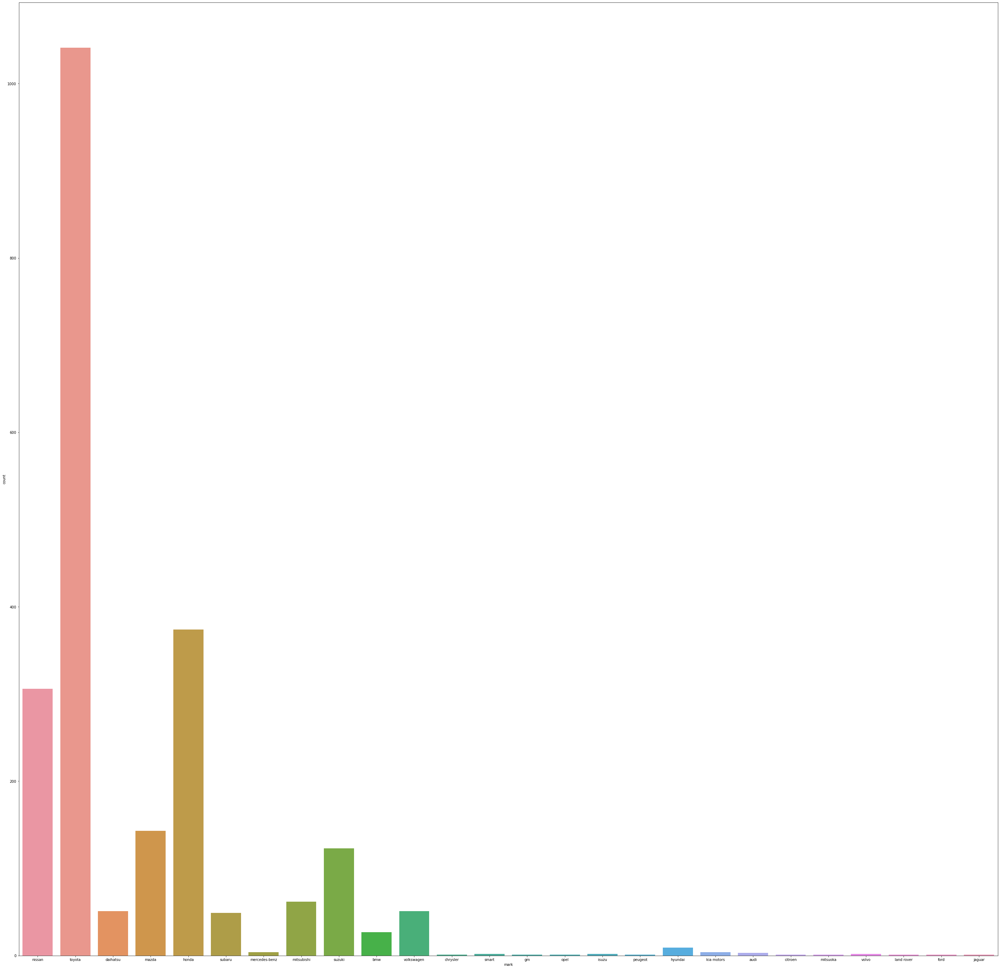

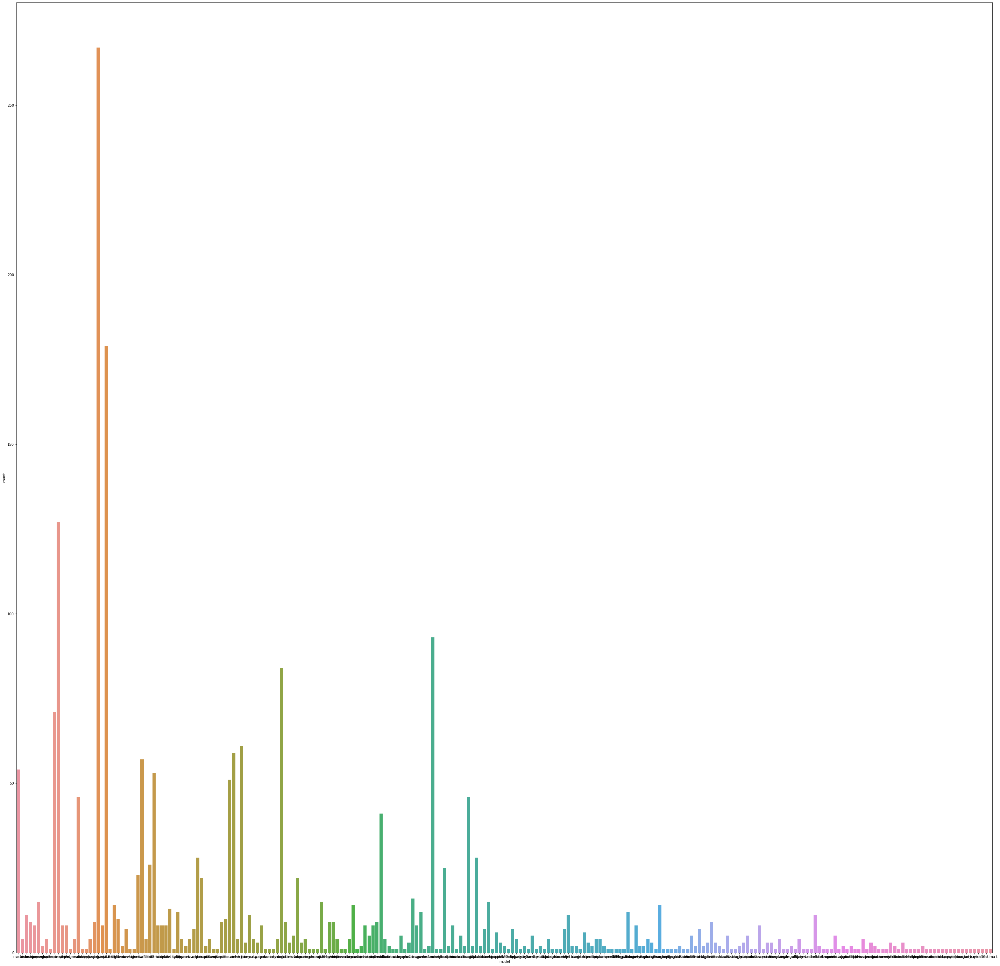

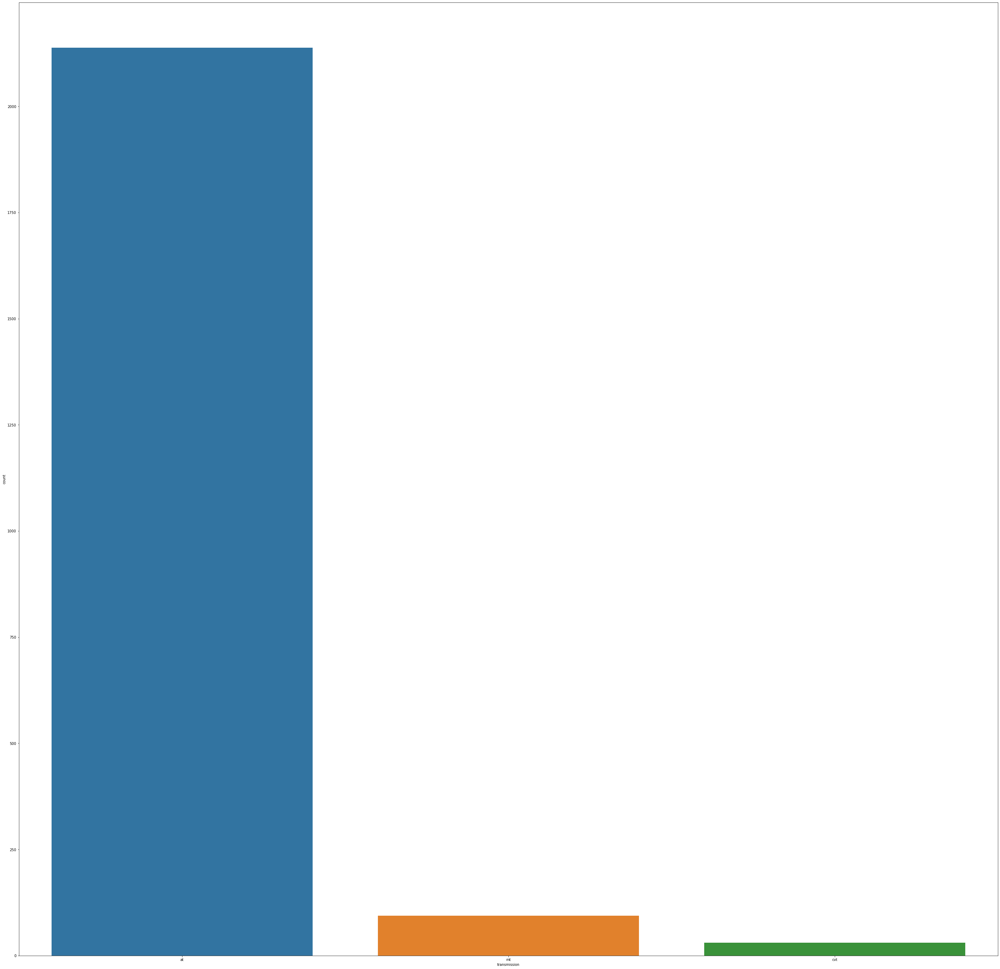

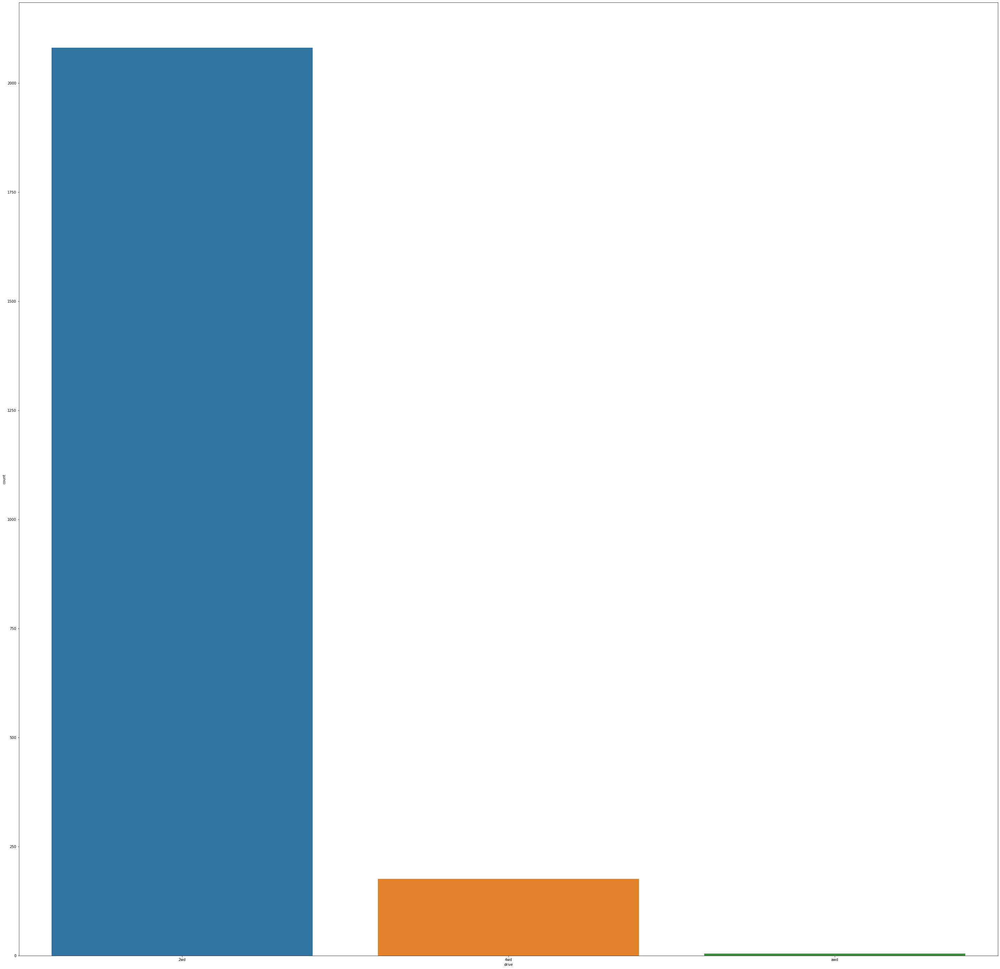

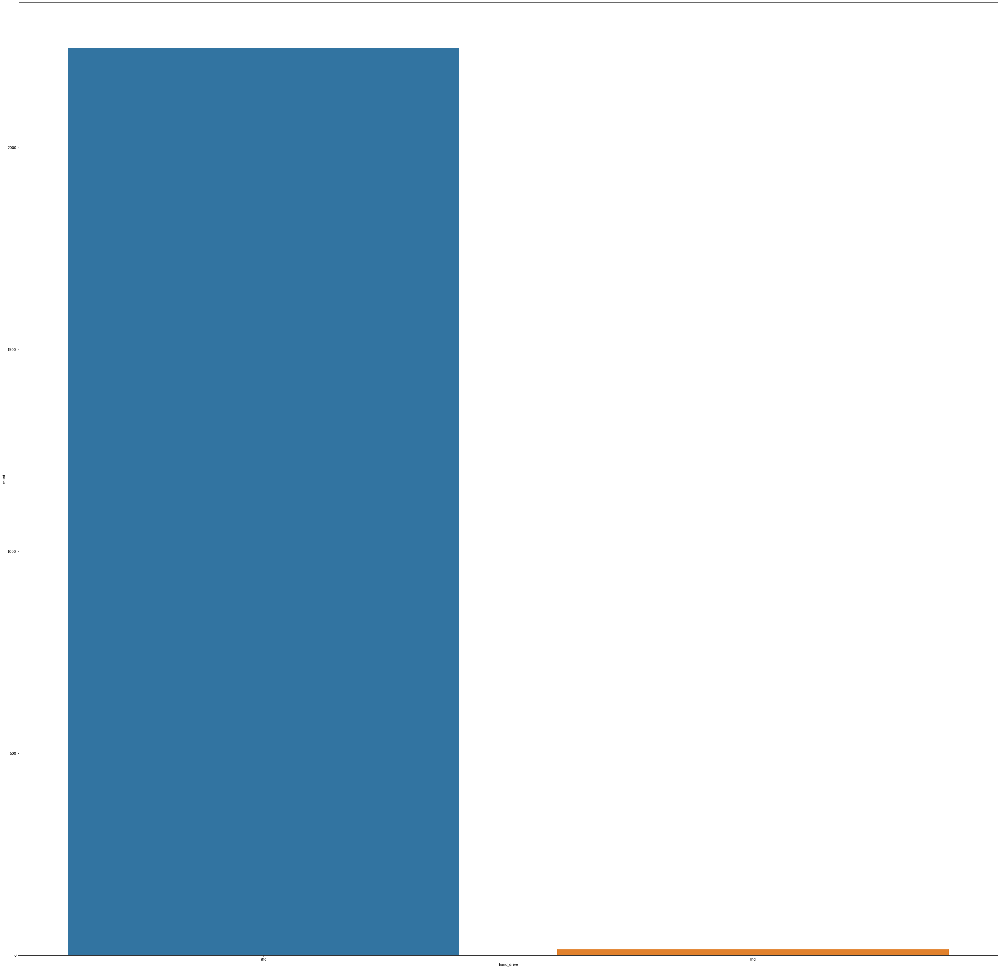

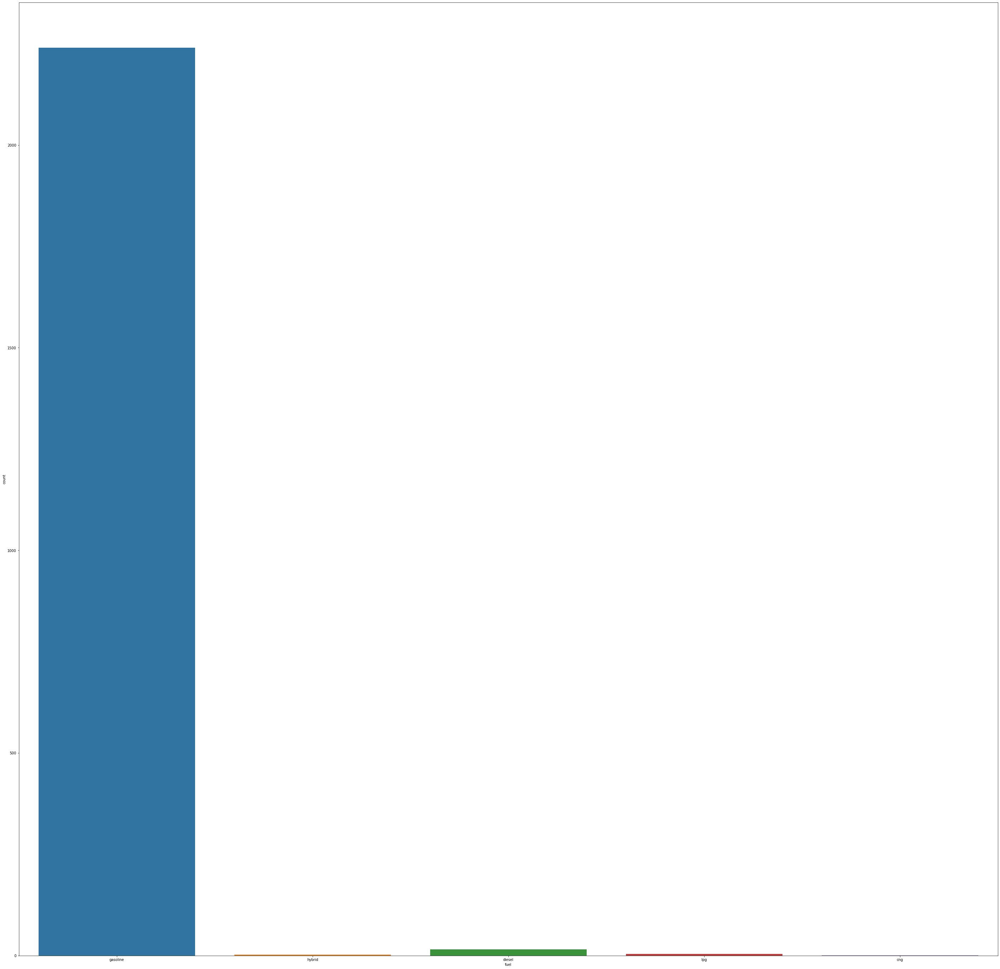

In [94]:
# Univariate analysis:

for i in cat_columns:
    f= plt.figure(figsize=(50,50))
    ax = sns.countplot(x=df[i],data=df)


<Figure size 7200x7200 with 0 Axes>

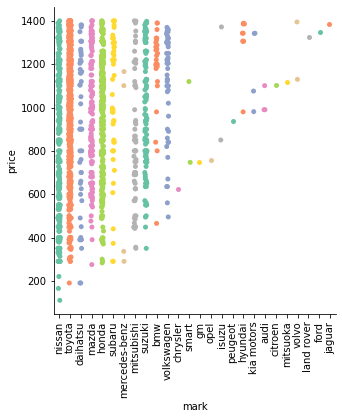

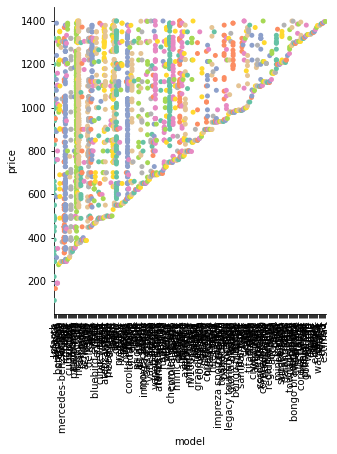

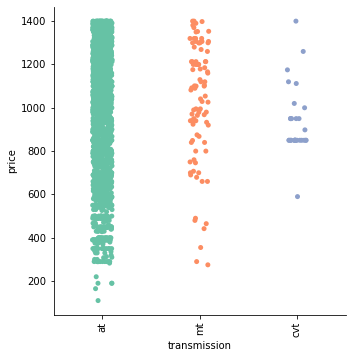

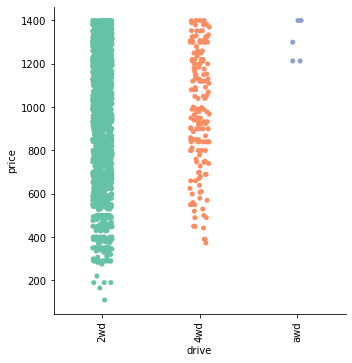

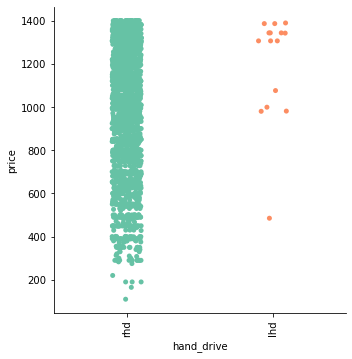

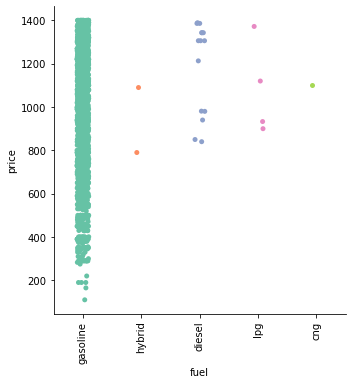

In [95]:
# Relation between price and other categorical features:

plt.figure(figsize=(100,100),facecolor='Yellow')
for i in cat_columns:
    sns.catplot(x = i , y = "price", palette = "Set2", data = df)
    plt.xticks(rotation=90)
plt.show()
    


<Figure size 7200x7200 with 0 Axes>

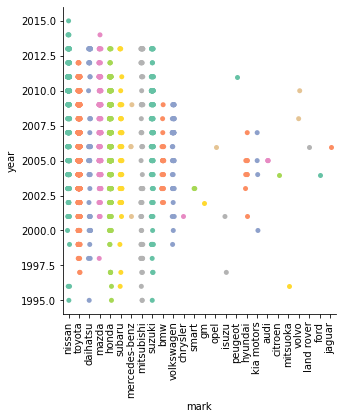

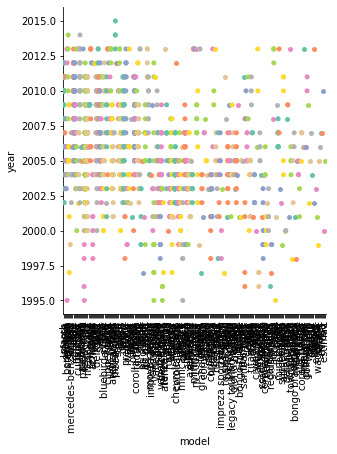

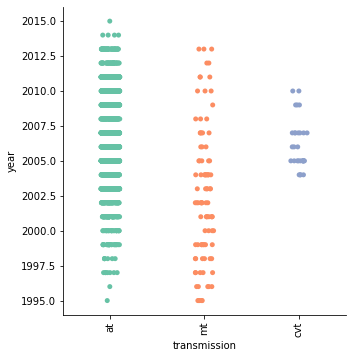

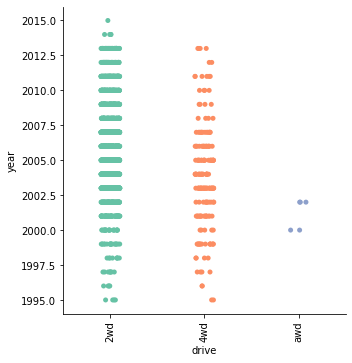

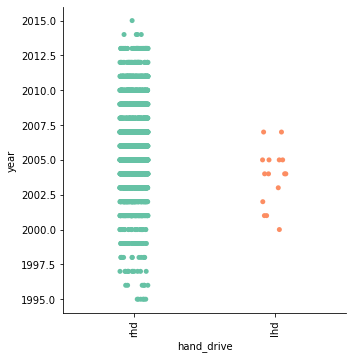

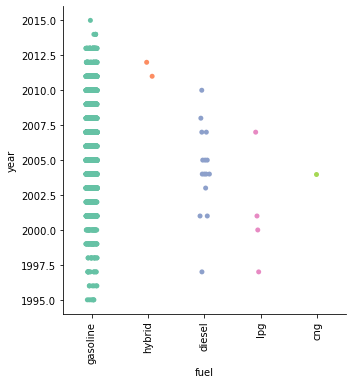

In [96]:
# Relation between year and other categorical features:

plt.figure(figsize=(100,100),facecolor='Yellow')
for i in cat_columns:
    sns.catplot(x = i , y = "year", palette = "Set2", data = df)
    plt.xticks(rotation=90)
plt.show()

<Figure size 7200x7200 with 0 Axes>

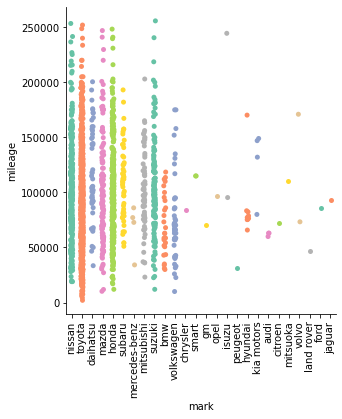

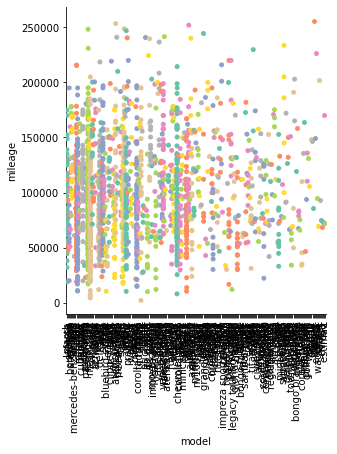

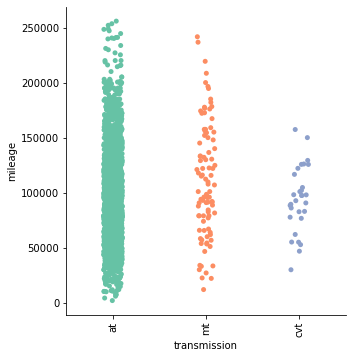

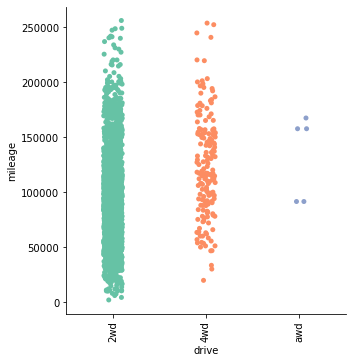

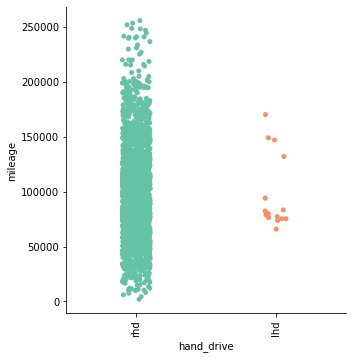

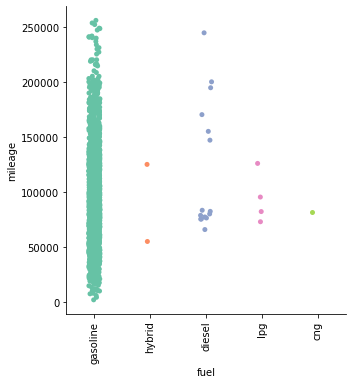

In [97]:
# Relation between mileage and other categorical features:

plt.figure(figsize=(100,100),facecolor='Yellow')
for i in cat_columns:
    sns.catplot(x = i , y = "mileage", palette = "Set2", data = df)
    plt.xticks(rotation=90)
plt.show()

<Figure size 7200x7200 with 0 Axes>

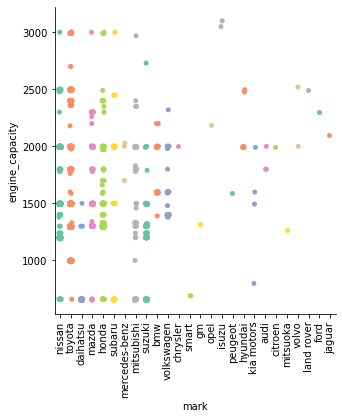

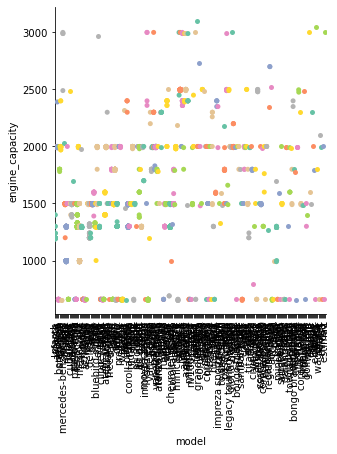

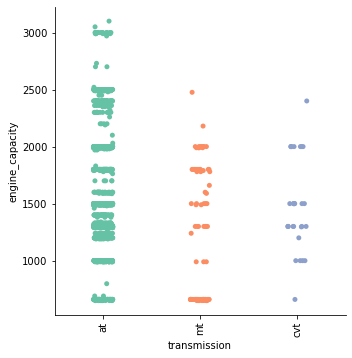

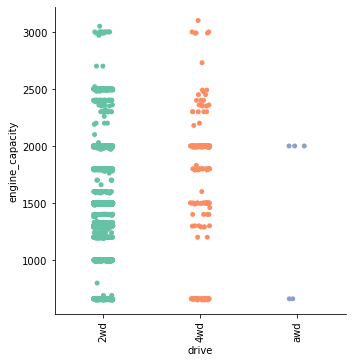

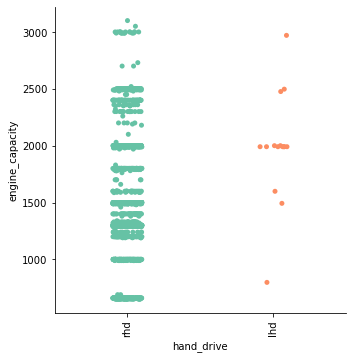

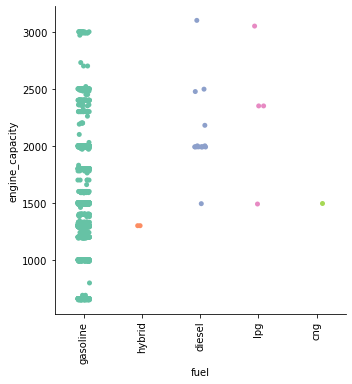

In [98]:
# Relation between engine_capacity and other categorical features:

plt.figure(figsize=(100,100),facecolor='Yellow')
for i in cat_columns:
    sns.catplot(x = i , y = "engine_capacity", palette = "Set2", data = df)
    plt.xticks(rotation=90)
plt.show()

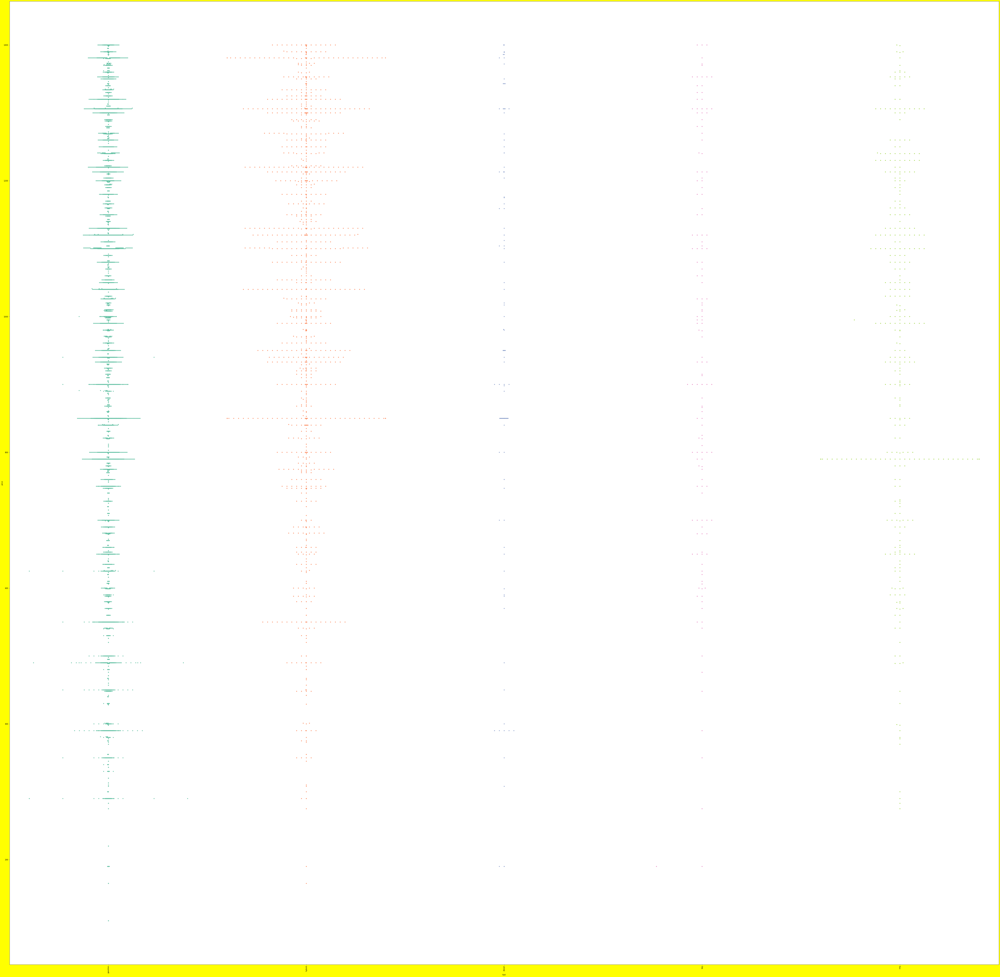

In [99]:
# Relation between price and other categorical features:

plt.figure(figsize=(100,100),facecolor='Yellow')
for i in cat_columns:
    sns.swarmplot(x = i , y = "price", palette = "Set2", data = df)
    plt.xticks(rotation=90)
plt.show()
    


<Figure size 7200x7200 with 0 Axes>

<Figure size 864x360 with 0 Axes>

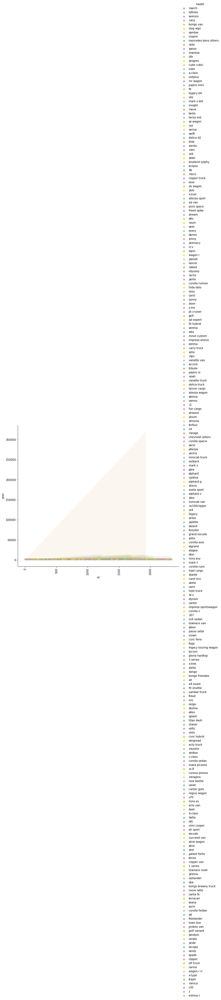

<Figure size 864x360 with 0 Axes>

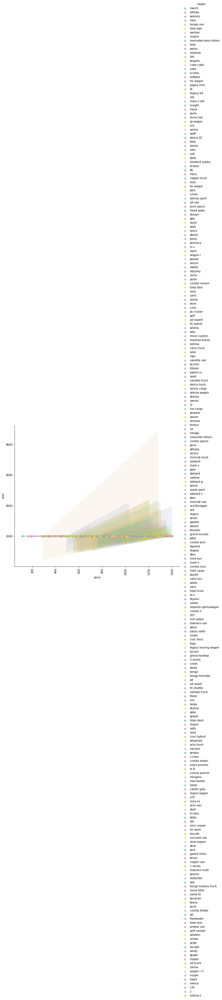

<Figure size 864x360 with 0 Axes>

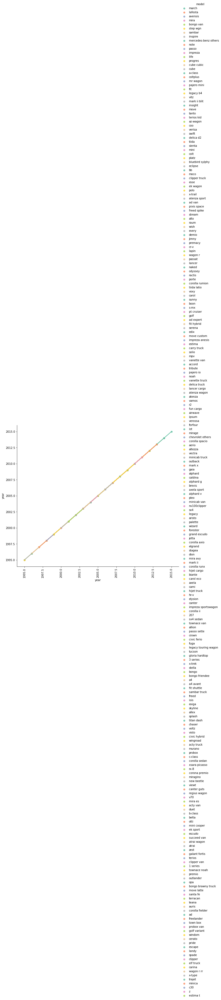

<Figure size 864x360 with 0 Axes>

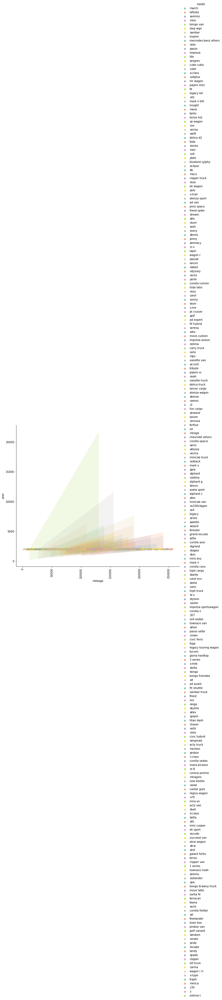

<Figure size 864x360 with 0 Axes>

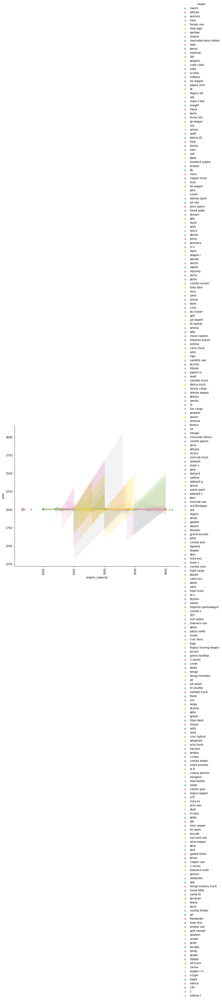

In [100]:
# Scatter plot of continuous features and year: 

plt.figure(figsize=(100,100),facecolor='Yellow')
for i in cont_columns:
    f= plt.figure(figsize=(12,5))
    ax =sns.lmplot(x = i , y = "year", data=df, hue='model', palette='Set2', height=8, aspect=1.2)
    plt.xticks(rotation=90)
plt.show()

<Figure size 7200x7200 with 0 Axes>

<Figure size 864x360 with 0 Axes>

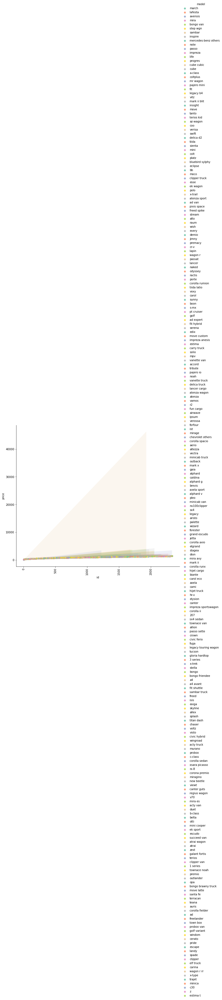

<Figure size 864x360 with 0 Axes>

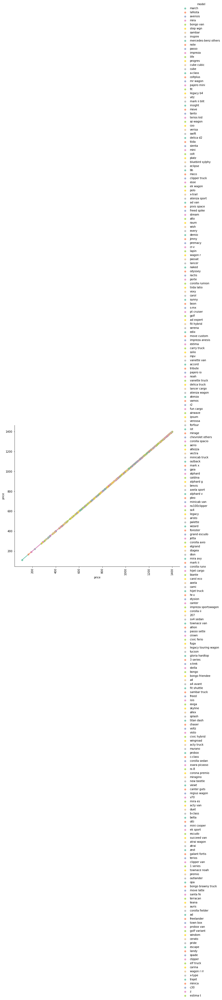

<Figure size 864x360 with 0 Axes>

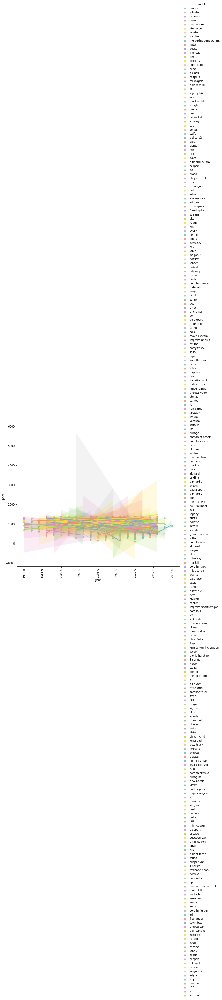

<Figure size 864x360 with 0 Axes>

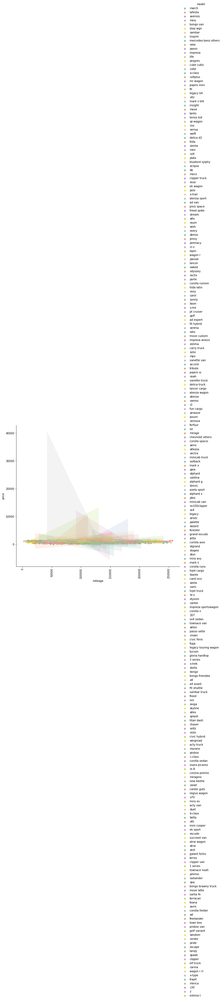

<Figure size 864x360 with 0 Axes>

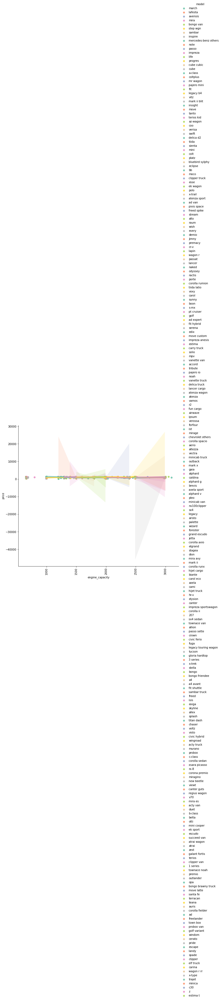

In [101]:
# Scatter plot of continuous features and price: 

plt.figure(figsize=(100,100),facecolor='Yellow')
for i in cont_columns:
    f= plt.figure(figsize=(12,5))
    ax =sns.lmplot(x = i , y = "price", data=df, hue='model', palette='Set2', height=8, aspect=1.2)
    plt.xticks(rotation=90)
plt.show()

<Figure size 7200x7200 with 0 Axes>

<Figure size 864x360 with 0 Axes>

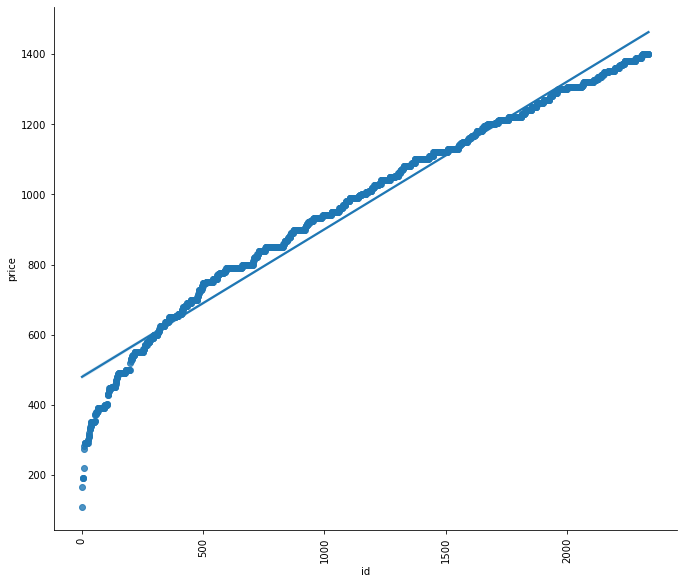

<Figure size 864x360 with 0 Axes>

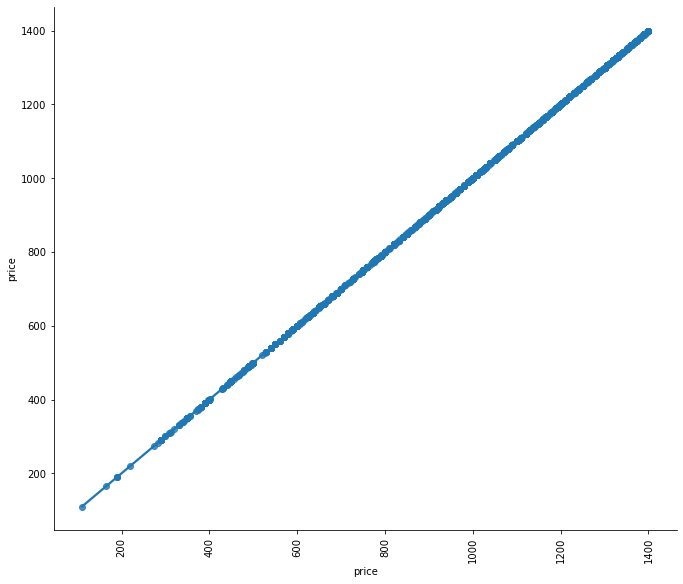

<Figure size 864x360 with 0 Axes>

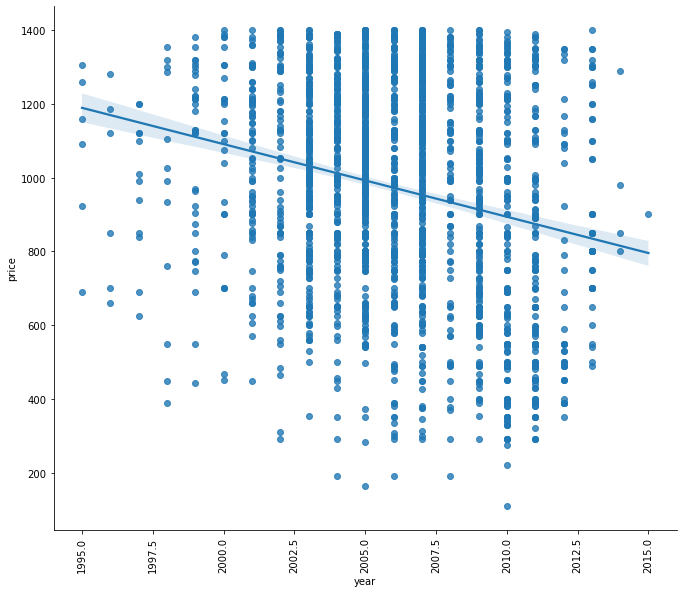

<Figure size 864x360 with 0 Axes>

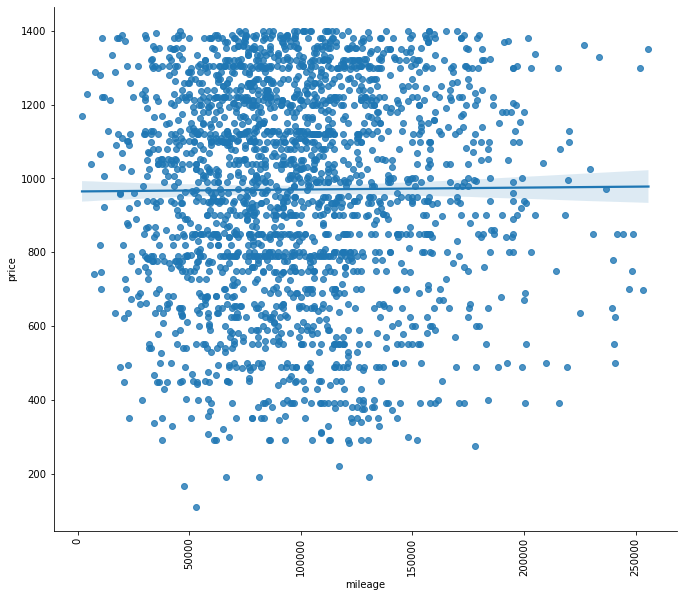

<Figure size 864x360 with 0 Axes>

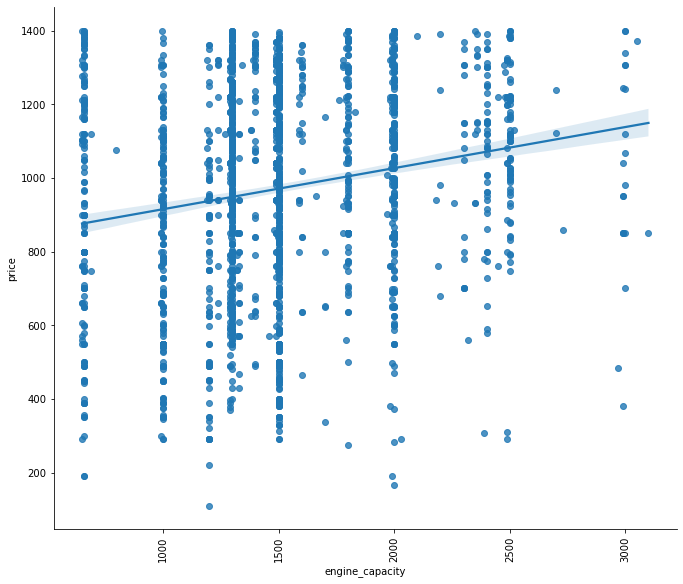

In [102]:
# Reg plot of continuous features and price: 

plt.figure(figsize=(100,100),facecolor='Yellow')
for i in cont_columns:
    f= plt.figure(figsize=(12,5))
    ax =sns.lmplot(x = i , y = "price", data=df, palette='Set2', height=8, aspect=1.2)
    plt.xticks(rotation=90)
plt.show()

<Figure size 7200x7200 with 0 Axes>

<Figure size 864x360 with 0 Axes>

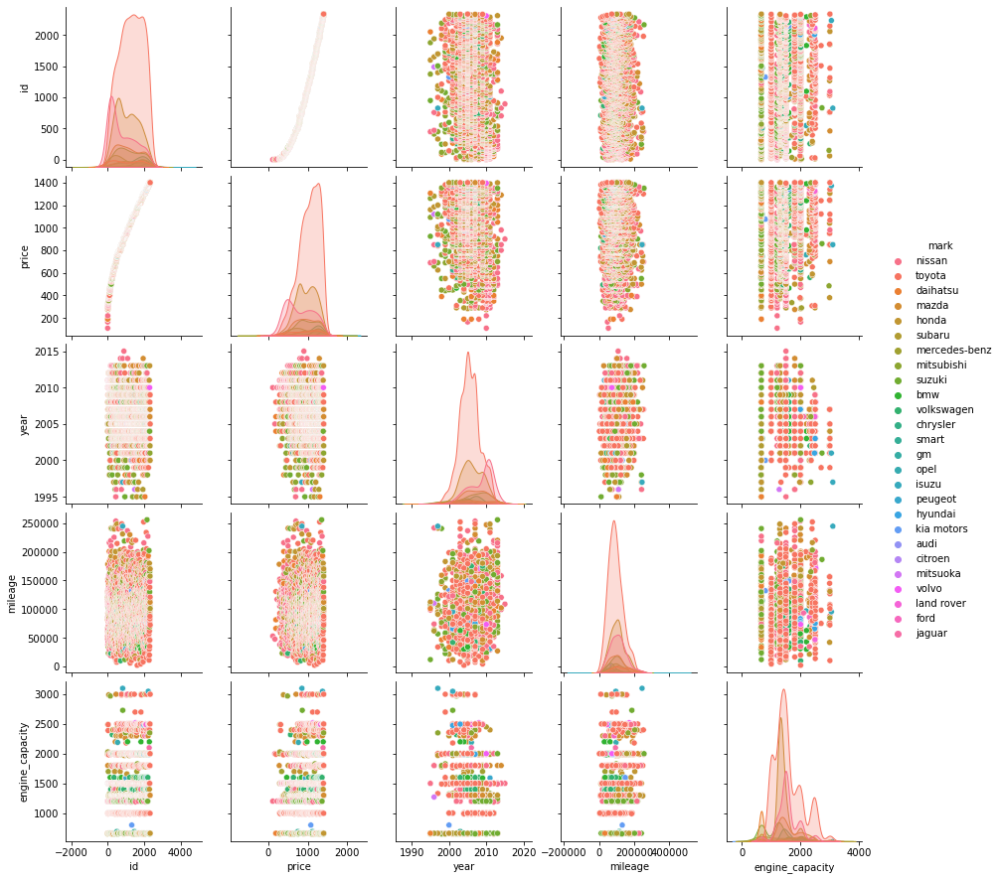

<Figure size 864x360 with 0 Axes>

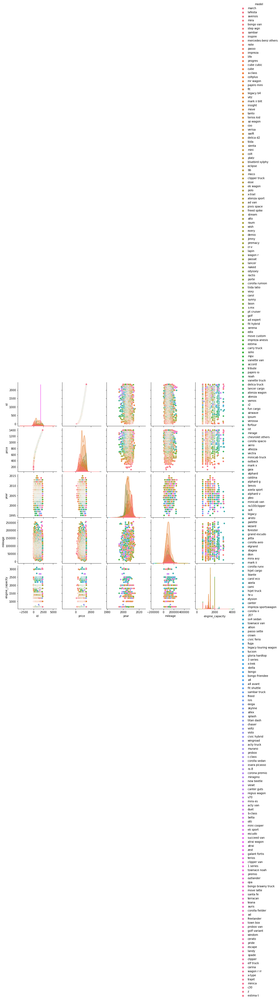

<Figure size 864x360 with 0 Axes>

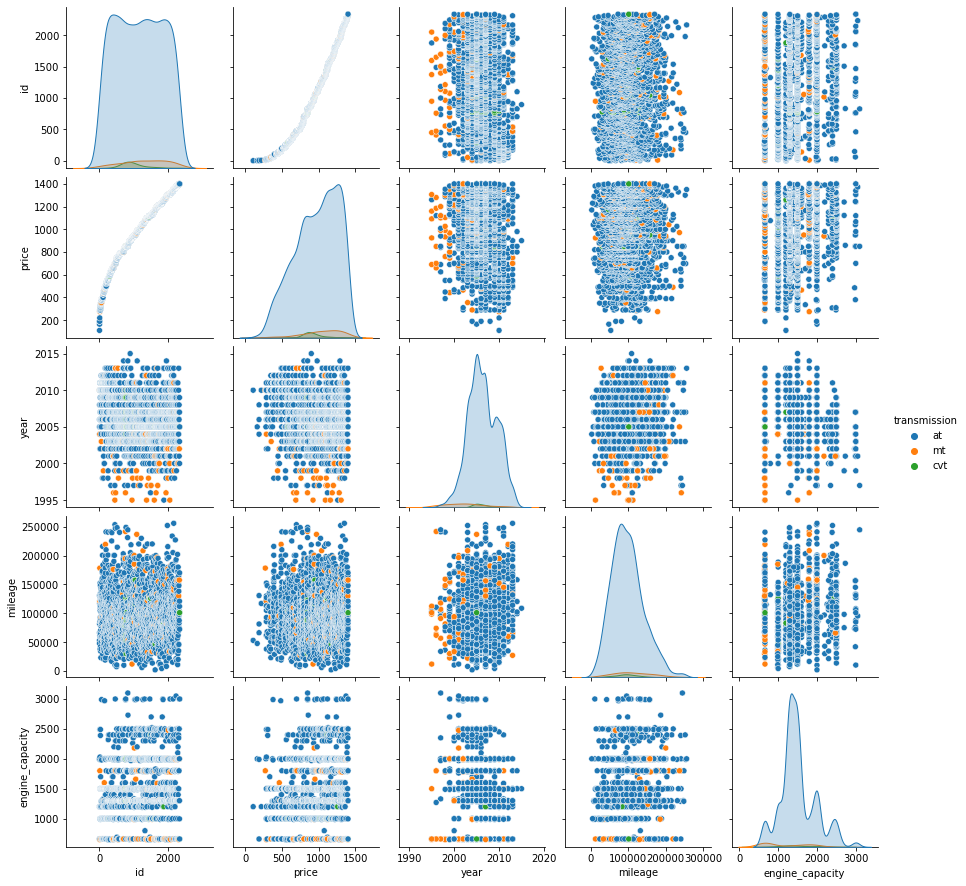

<Figure size 864x360 with 0 Axes>

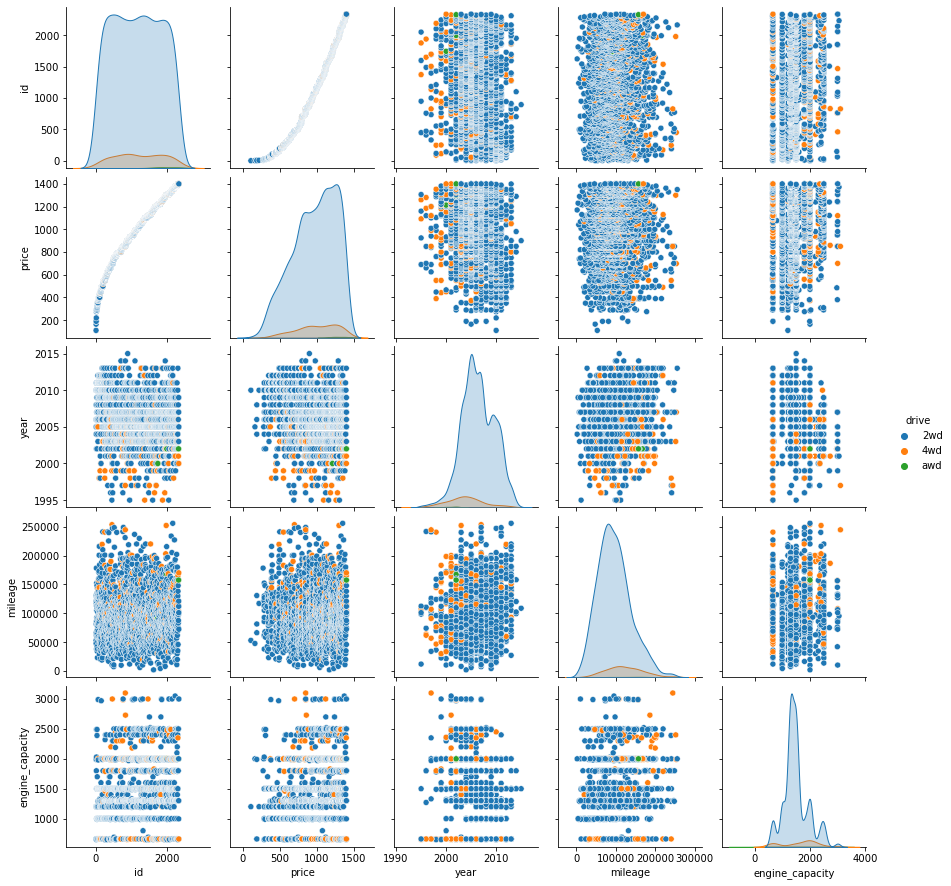

<Figure size 864x360 with 0 Axes>

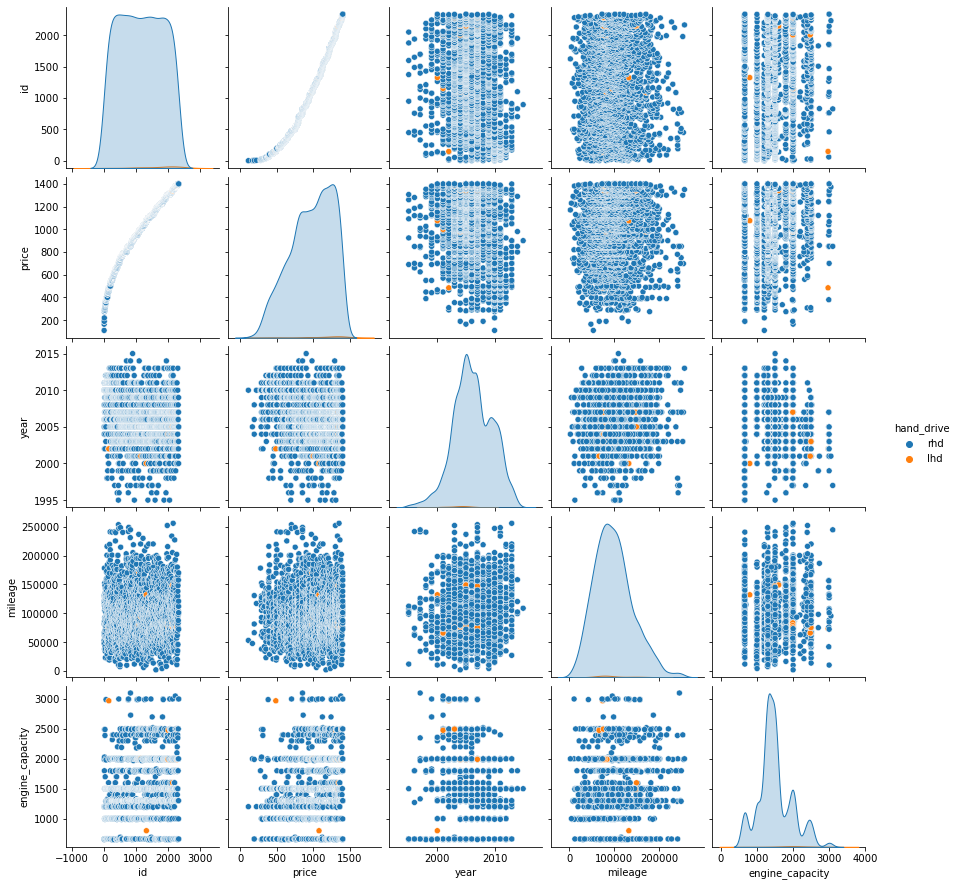

<Figure size 864x360 with 0 Axes>

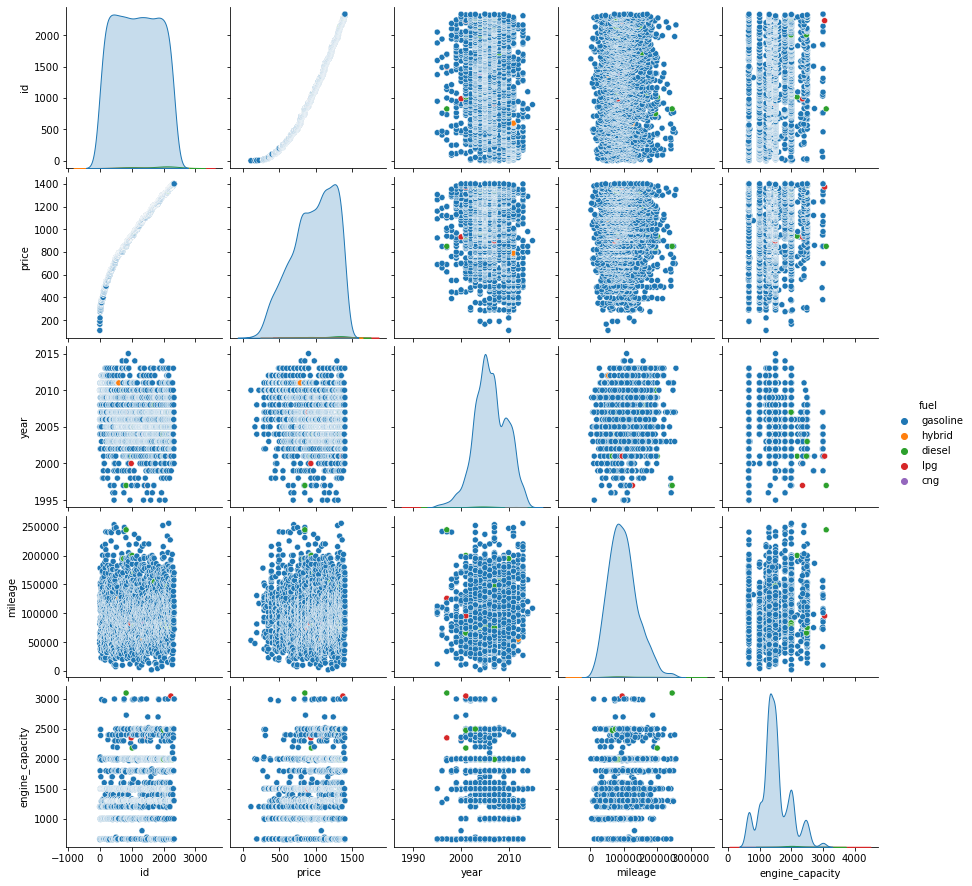

In [103]:
# Plotting pairs with different hues:

plt.figure(figsize=(100,100),facecolor='Yellow')
for i in cat_columns:
    f= plt.figure(figsize=(12,5))
    ax =sns.pairplot(df,hue=i)
    plt.xticks(rotation=90)
plt.show()

In [104]:
report = ProfileReport(df)
report

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

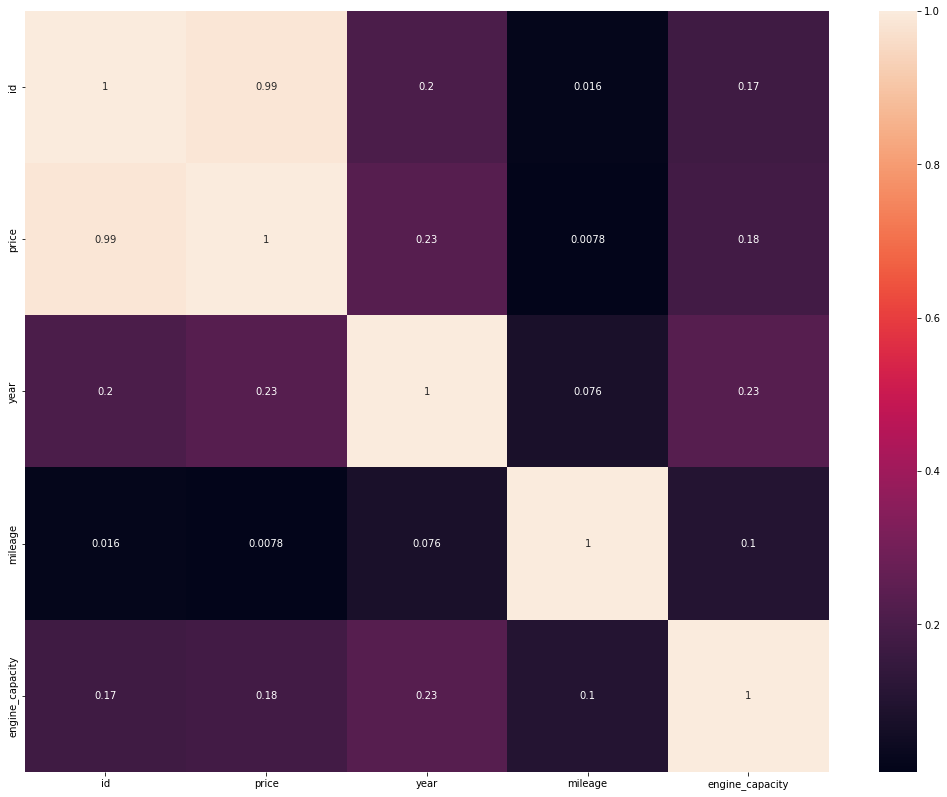

In [27]:
df_corr = df.corr().abs()
plt.figure(figsize=(18,14))
sns.heatmap(df_corr,annot=True,annot_kws={'size':10})
plt.show()

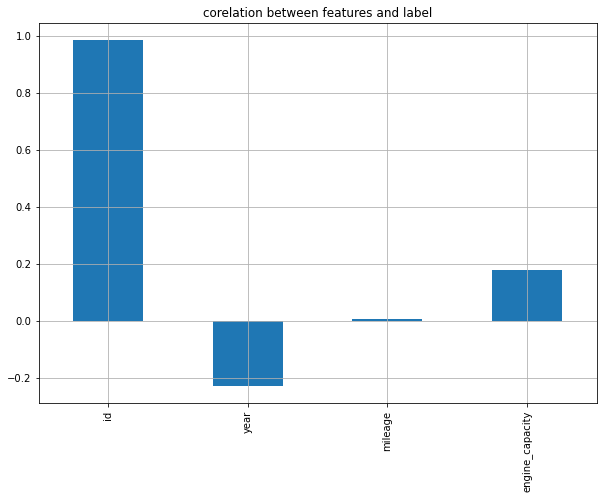

In [105]:
# Correlation between features and label:

df.drop(columns = 'price',axis = 1).corrwith(df.price).plot(kind='bar',grid=True,figsize=(10,7),title='corelation between features and label')
plt.show()

In [15]:
# Checking skewness
df.skew().sort_values(ascending=False)

engine_capacity    0.607818
mileage            0.601181
id                 0.008763
year              -0.143756
price             -0.448396
dtype: float64

In [18]:
# Defining labels and features:

X_old = df.drop(labels = ['price'],axis=1)
y = df['price']

X = pd.get_dummies(X_old)

In [19]:
# Checking multicolinearity problem: if one feature is influencing any other feature using VIF
# Applying standard scaler

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

In [28]:
from statsmodels.stats.outliers_influence import variance_inflation_factor


vif = pd.DataFrame()
vif['vif'] = [variance_inflation_factor(df[cont_columns],i) for i in range(df[cont_columns].shape[1])]
vif['features'] = df[cont_columns].columns
vif

# These number indicate that if vif value < 5 , 
# no multicolinearity problem exist

,vif,features
0,138.747348,id
1,430.404995,price
2,111.214766,year
3,6.204083,mileage
4,11.834262,engine_capacity


In [29]:
for i in vif['vif']:
    if i > 5.00:
        print('Value',i)

Value 138.7473478884404
Value 430.4049952624573
Value 111.21476554839586
Value 6.204082762753168
Value 11.834262139046318


In [30]:
from sklearn.decomposition import PCA

pca = PCA()
pca.fit_transform(X_scaled)


array([[-4.78831008e-01, -7.87540455e-01, -2.78391249e+00, ...,
        -1.06316583e-15, -5.75878056e-16, -5.33715120e-16],
       [-2.64105389e-01, -7.06230462e-01, -1.42650927e+00, ...,
         1.34216025e-15, -1.72725045e-15, -2.47459593e-16],
       [-2.81742489e-01, -9.77899744e-01,  1.04536180e+00, ...,
        -1.93641340e-15,  2.63564558e-16, -1.29433866e-16],
       ...,
       [-8.32859858e-02,  4.08214496e+00,  4.83738152e-01, ...,
         2.35979736e-16,  1.10908834e-16,  1.76504488e-17],
       [ 8.35545259e-02,  4.35179999e+00,  1.17055053e-01, ...,
         5.65905984e-18,  1.22845626e-17,  9.91681447e-18],
       [ 1.19548624e-01, -9.50207681e-01,  3.48428342e+00, ...,
         5.65905984e-18,  1.22845626e-17,  9.91681447e-18]])

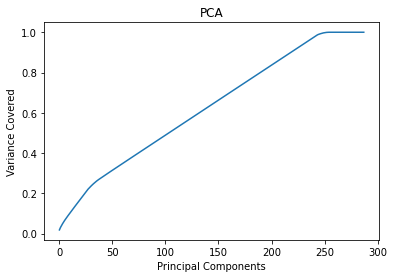

In [31]:
# Using Scree Plot to identify best components:

plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Principal Components')
plt.ylabel('Variance Covered')
plt.title('PCA')
plt.show()

In [32]:
pca = PCA(n_components=250)
pca.fit_transform(X)
new_pcomp = pca.fit_transform(X_scaled)


In [33]:
new_pcomp

array([[-0.47883101, -0.78754046, -2.78391249, ..., -0.35685687,
         0.15950063, -0.08245322],
       [-0.26410539, -0.70623046, -1.42650927, ..., -0.58847927,
         0.59790105,  0.08156069],
       [-0.28174249, -0.97789974,  1.0453618 , ..., -0.03403294,
         0.4776091 , -0.20235381],
       ...,
       [-0.08328599,  4.08214496,  0.48373815, ...,  0.41173664,
        -1.05019694, -0.3548216 ],
       [ 0.08355453,  4.35179999,  0.11705505, ...,  0.08618211,
         1.80314656,  0.18274126],
       [ 0.11954862, -0.95020768,  3.48428342, ..., -0.41764874,
         0.54512979, -0.00905296]])

In [35]:
princi_comp = pd.DataFrame(new_pcomp)
princi_comp.head()

,0,1,2,3,4,5,6,7,8,9,...,240,241,242,243,244,245,246,247,248,249
0,-0.478831,-0.787540,-2.783912,0.887136,-0.783756,2.387661,-0.052106,0.610394,-0.037732,0.391358,...,6.100981e-15,-1.853997e-13,1.159669e-13,-1.506780e-12,-0.128866,0.188338,0.275048,-0.356857,0.159501,-0.082453
1,-0.264105,-0.706230,-1.426509,1.592669,-1.154676,2.021670,0.703438,0.650934,0.117146,0.274390,...,-8.954980e-12,3.067393e-12,-4.111855e-12,-3.495813e-11,-0.138665,0.134287,-0.264666,-0.588479,0.597901,0.081561
2,-0.281742,-0.977900,1.045362,0.171264,-0.367614,0.722295,-0.279400,0.455528,0.370576,-0.227795,...,9.090304e-13,2.209787e-13,3.523265e-13,-2.198014e-12,-0.447011,-0.482157,-1.278223,-0.034033,0.477609,-0.202354
3,-0.499007,0.654521,-2.957333,-2.512778,1.824510,0.405240,-2.303301,1.289268,-0.268819,5.355163,...,5.899334e-13,-1.517092e-12,-1.466923e-12,1.073206e-11,-0.117344,0.218047,-0.147451,-0.763318,0.354217,-0.031005
4,-0.465169,0.799056,-2.790421,-2.492431,1.830692,0.297108,-2.304945,1.302659,-0.213860,5.340128,...,5.932654e-13,-1.497780e-12,-1.472840e-12,1.054242e-11,-0.117406,0.174393,-0.295706,-0.656792,0.532569,0.125007


In [38]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

selection = SelectKBest(score_func=chi2)
fit = selection.fit(X,y)

In [40]:
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Features','Score'] 

In [41]:
print(featureScores.nlargest(250,'Score'))  #print250 best features
feat=list(featureScores.nlargest(250,'Score')['Features'])

                 Features         Score
2                 mileage  9.828821e+06
0                      id  8.811817e+05
3         engine_capacity  7.902690e+04
14            mark_jaguar  2.261000e+03
271          model_x-type  2.261000e+03
..                    ...           ...
67            model_bongo  6.754545e+01
69   model_bongo friendee  6.754545e+01
127     model_fit shuttle  6.754545e+01
229          model_stella  6.754545e+01
41           model_ad van  6.618436e+01

[250 rows x 2 columns]


In [52]:
# Splitting model:
x_train,x_test,y_train,y_test = train_test_split(X[feat],y,train_size=0.25,random_state=355)

In [53]:
print(princi_comp.shape)

print(y_train.shape)

(2262, 250)
(565,)


In [54]:
# MOdel instantiating and training

rm = LinearRegression()
rm.fit(x_train,y_train) 
y_pred = rm.predict(x_test)


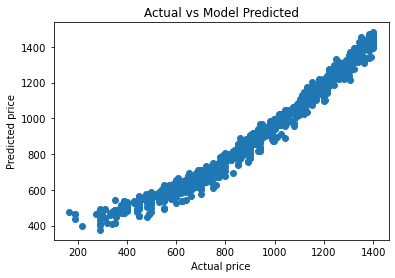

In [55]:
plt.scatter(y_test,y_pred)
plt.xlabel('Actual price')
plt.ylabel('Predicted price')
plt.title('Actual vs Model Predicted')
plt.show()

In [56]:
#model performance

print("MAE: ", metrics.mean_absolute_error(y_test, y_pred))
print("MSE: ", metrics.mean_squared_error(y_test, y_pred))
print("RMSE: ", metrics.mean_squared_error(y_test, y_pred, squared=False))
print("R2: ", metrics.r2_score(y_test, y_pred), "\n")
print("Score: ", rm.score(x_test, y_test))

MAE:  37.02788962973935
MSE:  2434.458202231178
RMSE:  49.340229045183584
R2:  0.9708145825659459 

Score:  0.9708145825659459


In [58]:
from sklearn.linear_model import Ridge,Lasso,RidgeCV,LassoCV

lassocv = LassoCV(alphas = None , max_iter = 100, normalize = True)
lassocv.fit(x_train,y_train)

# Best alpha parameter
alpha = lassocv.alpha_ # Best alpha rate
alpha

# Now since we have the best parameter, lasso regression will be used:
lasso_reg = Lasso(alpha)
lasso_reg.fit(x_train,y_train)
# i.e. when model is training it will learn at this speed 6....

lasso_reg.score(x_test,y_test)

0.9734920564408978

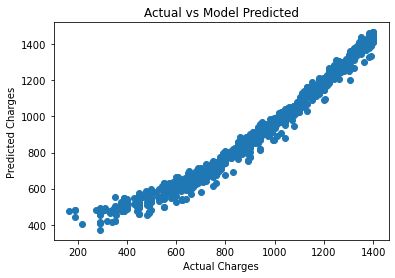

MAE:  34.91127421858663
MSE:  2316.8238975137597
RMSE:  48.13339690395598
R2:  0.9722248373341715 

Score:  0.9722248373341715


In [65]:
# Ridge Method:

ridgecv = RidgeCV(alphas = np.arange(0.001,0.1,0.01),normalize = True)
ridgecv.fit(x_train,y_train)

ridgecv.alpha_ # Best alpha rate

ridgecv.score(x_test,y_test)

# PLotting and visualizing

y_predrv = ridgecv.predict(x_test)

# y_pred

plt.scatter(y_test,y_predrv)
plt.xlabel('Actual Charges')
plt.ylabel('Predicted Charges')
plt.title('Actual vs Model Predicted')
plt.show()

print("MAE: ", metrics.mean_absolute_error(y_test, y_predrv))
print("MSE: ", metrics.mean_squared_error(y_test, y_predrv))
print("RMSE: ", metrics.mean_squared_error(y_test, y_predrv, squared=False))
print("R2: ", metrics.r2_score(y_test, y_predrv), "\n")
print("Score: ", ridgecv.score(x_test, y_test))

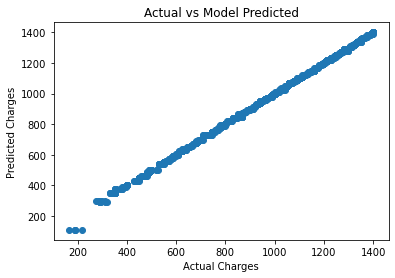

MAE:  1.9357690041249263
MSE:  37.92162639952858
RMSE:  6.158053783422858
R2:  0.999545377901648 

Score:  1.0


In [64]:
# Using decision tree:

from sklearn.tree import DecisionTreeRegressor

model = DecisionTreeRegressor()

model.fit(x_train, y_train)

y_preddt = model.predict(x_test)

r2_score(y_test,y_preddt)




print("MAE: ", metrics.mean_absolute_error(y_test, y_preddt))
print("MSE: ", metrics.mean_squared_error(y_test, y_preddt))
print("RMSE: ", metrics.mean_squared_error(y_test, y_preddt, squared=False))
print("R2: ", metrics.r2_score(y_test, y_preddt), "\n")
print("Score: ", model.score(x_test, y_preddt))


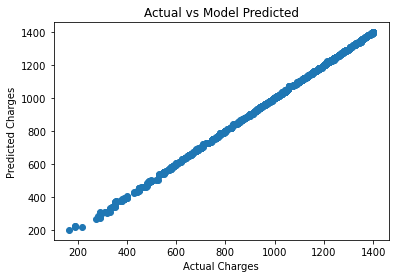

MAE:  1.5851974071891552
MSE:  11.257525869180906
RMSE:  3.355223669024303
R2:  0.9998650395428988 

Score:  1.0


In [67]:
# Random forest:

from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error,mean_squared_error

regressor_rf = RandomForestRegressor(n_estimators = 100)

regressor_rf.fit(x_train, y_train)

lr_normal_rf = regressor_rf.score(x_train, y_train)

lr_normal_rf

y_predrf = regressor_rf.predict(x_test)

lr_normal_rf_test = regressor_rf.score(x_test, y_test)

lr_normal_rf_test

mse_lr_normal_rf  = mean_absolute_error(y_test, y_predrf)

mse_lr_normal_rf

plt.scatter(y_test,y_predrf)
plt.xlabel('Actual Charges')
plt.ylabel('Predicted Charges')
plt.title('Actual vs Model Predicted')
plt.show()

# Model Evaluation: MAE , MSE , RMSE


print("MAE: ", metrics.mean_absolute_error(y_test, y_predrf))
print("MSE: ", metrics.mean_squared_error(y_test, y_predrf))
print("RMSE: ", metrics.mean_squared_error(y_test, y_predrf, squared=False))
print("R2: ", metrics.r2_score(y_test, y_predrf), "\n")
print("Score: ", regressor_rf.score(x_test, y_predrf))

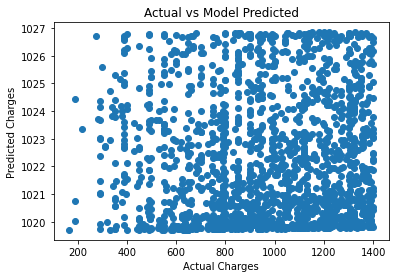

MAE:  242.68016349023628
MSE:  86045.88157037606
RMSE:  293.3357829695792
R2:  -0.03155805665959566 

Score:  1.0


In [70]:
# Using Support vector regressor:

# Fit the model over the training data
from sklearn.svm import SVR
svr = SVR()
svr.fit(x_train, y_train)

y_predsvr = svr.predict(x_test)

r2_score(y_test,y_predsvr)

y_predsvr

mse_svr  = mean_absolute_error(y_test, y_predsvr)

mse_svr

plt.scatter(y_test,y_predsvr)
plt.xlabel('Actual Charges')
plt.ylabel('Predicted Charges')
plt.title('Actual vs Model Predicted')
plt.show()

# Model Evaluation: MAE , MSE , RMSE

print("MAE: ", metrics.mean_absolute_error(y_test, y_predsvr))
print("MSE: ", metrics.mean_squared_error(y_test, y_predsvr))
print("RMSE: ", metrics.mean_squared_error(y_test, y_predsvr, squared=False))
print("R2: ", metrics.r2_score(y_test, y_predsvr), "\n")
print("Score: ", svr.score(x_test, y_predsvr))


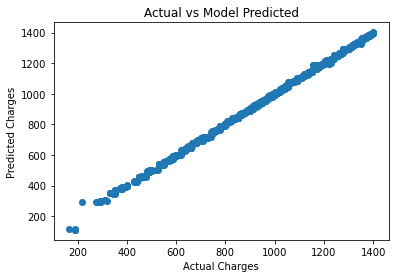

MAE:  3.5022469173829274
MSE:  44.539836882141834
RMSE:  6.67381726466509
R2:  0.9994660357156026 

Score:  1.0


In [71]:
import xgboost as xgb

# Using XGBoost:

xgb_clf = xgb.XGBRegressor()
xgb_clf.fit(x_train,y_train)

y_predx = xgb_clf.predict(x_test)

r2_score(y_test,y_predx)

plt.scatter(y_test,y_predx)
plt.xlabel('Actual Charges')
plt.ylabel('Predicted Charges')
plt.title('Actual vs Model Predicted')
plt.show()

# Model Evaluation: MAE , MSE , RMSE

from sklearn.metrics import mean_absolute_error,mean_squared_error

print("MAE: ", metrics.mean_absolute_error(y_test, y_predx))
print("MSE: ", metrics.mean_squared_error(y_test, y_predx))
print("RMSE: ", metrics.mean_squared_error(y_test, y_predx, squared=False))
print("R2: ", metrics.r2_score(y_test, y_predx), "\n")
print("Score: ", xgb_clf.score(x_test, y_predx))

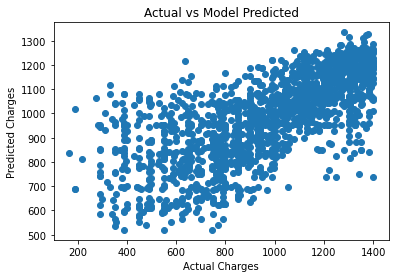

MAE:  152.67224513847967
MSE:  42044.762899233945
RMSE:  205.0481965276309
R2:  0.49594782321366515 

Score:  -0.3885998645990343


In [72]:
# Innitiate k neighbour Regressor:

from sklearn.neighbors import KNeighborsRegressor

knn = KNeighborsRegressor()

knn.fit(x_train,y_train)

y_predknn = knn.predict(x_test)

r2_score(y_test,y_predknn)

plt.scatter(y_test,y_predknn)
plt.xlabel('Actual Charges')
plt.ylabel('Predicted Charges')
plt.title('Actual vs Model Predicted')
plt.show()

# Model Evaluation: MAE , MSE , RMSE

from sklearn.metrics import mean_absolute_error,mean_squared_error

print("MAE: ", metrics.mean_absolute_error(y_test, y_predknn))
print("MSE: ", metrics.mean_squared_error(y_test, y_predknn))
print("RMSE: ", metrics.mean_squared_error(y_test, y_predknn, squared=False))
print("R2: ", metrics.r2_score(y_test, y_predknn), "\n")
print("Score: ", xgb_clf.score(x_test, y_predknn))

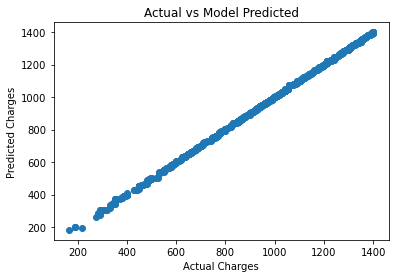

MAE:  1.5922510312315838
MSE:  9.581963288155558
RMSE:  3.0954746466665752
R2:  0.999885126966589 

Score:  1.0


In [73]:
# Random forest:

from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error,mean_squared_error

regressor_rf = RandomForestRegressor()

regressor_rf.fit(x_train, y_train)

lr_normal_rf = regressor_rf.score(x_train, y_train)

lr_normal_rf

y_predrf = regressor_rf.predict(x_test)

lr_normal_rf_test = regressor_rf.score(x_test, y_test)

lr_normal_rf_test

mse_lr_normal_rf  = mean_absolute_error(y_test, y_predrf)

mse_lr_normal_rf

plt.scatter(y_test,y_predrf)
plt.xlabel('Actual Charges')
plt.ylabel('Predicted Charges')
plt.title('Actual vs Model Predicted')
plt.show()

# Model Evaluation: MAE , MSE , RMSE


print("MAE: ", metrics.mean_absolute_error(y_test, y_predrf))
print("MSE: ", metrics.mean_squared_error(y_test, y_predrf))
print("RMSE: ", metrics.mean_squared_error(y_test, y_predrf, squared=False))
print("R2: ", metrics.r2_score(y_test, y_predrf), "\n")
print("Score: ", regressor_rf.score(x_test, y_predrf))

In [79]:
# Finding best random state for Random Forest model:

maxAccu = 0
maxREG = 0

for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(X_scaled,y,test_size = 0.25 , random_state=1)
    regressor_rf = RandomForestRegressor()
    regressor_rf.fit(x_train, y_train) 
    y_predrf = regressor_rf.predict(x_test)
    reg_score = regressor_rf.score(x_test, y_test)
    print('Testing accuracy: ', reg_score, 'at random state', i)
    
    if reg_score > maxRM:
        maxAccu = reg_score
        maxREG = i
        print('Max accuracy',maxAccu,'max random state',maxREG)
        #model performance
        print("MAE: ", metrics.mean_absolute_error(y_test, y_predrf))
        print("MSE: ", metrics.mean_squared_error(y_test, y_predrf))
        print("RMSE: ", metrics.mean_squared_error(y_test, y_predrf, squared=False))
        print("R2: ", metrics.r2_score(y_test, y_predrf), "\n")
        print("Score: ", regressor_rf.score(x_test, y_predrf))

Testing accuracy:  0.9999702787180299 at random state 1
Max accuracy 0.9999702787180299 max random state 1
MAE:  0.6366077738515862
MSE:  2.3404812720848067
RMSE:  1.529863154692212
R2:  0.9999702787180299 

Score:  1.0
Testing accuracy:  0.9999682772068731 at random state 2
Max accuracy 0.9999682772068731 max random state 2
MAE:  0.6369434628975207
MSE:  2.498095583038867
RMSE:  1.5805364858296904
R2:  0.9999682772068731 

Score:  1.0
Testing accuracy:  0.999966269402411 at random state 3
Max accuracy 0.999966269402411 max random state 3
MAE:  0.6536572438162517
MSE:  2.656205477031813
RMSE:  1.6297869422203053
R2:  0.999966269402411 

Score:  1.0
Testing accuracy:  0.9999659154853173 at random state 4
Max accuracy 0.9999659154853173 max random state 4
MAE:  0.6542402826855087
MSE:  2.684075618374563
RMSE:  1.6383148715599707
R2:  0.9999659154853173 

Score:  1.0
Testing accuracy:  0.9999711680417193 at random state 5
Max accuracy 0.9999711680417193 max random state 5
MAE:  0.62512367

In [80]:
# Best random state = 5

199

In [84]:
# Hyper parameter tuning for random forrest regressor:

min_split = np.array([2,5,7])
max_nvl = np.array([3,5,7,9,11])
alg = ['squared_error','absolute_error']
n_est = [50,100,150,200]
values_grid = {'min_samples_split': min_split, 'max_depth': max_nvl, 'criterion': alg,'n_estimators':n_est}

gridregTree = GridSearchCV(estimator = regressor_rf, param_grid = values_grid, cv = 5)

gridregTree.fit(x_train, y_train)

y_predreg = regressor_rf.predict(x_test)

r2_score(y_test,y_predreg)

KeyboardInterrupt: 